In [1]:
try:
    from google.colab import drive
    drive.mount('/content/drive/')
    %cd '/content/drive/MyDrive/Parkinson_data_paper/'
    COLAB = True
    project_url = './'
except ModuleNotFoundError:
    COLAB = False
    project_url = './'

In [2]:
if COLAB:
    !pip install catboost interpret xgboost lightgbm

In [3]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score, accuracy_score, precision_score, recall_score, roc_curve, auc, precision_recall_curve

from catboost import CatBoostClassifier
from interpret.glassbox import ExplainableBoostingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.linear_model import LogisticRegression

In [4]:
data = pd.read_csv(f'{project_url}/dataset/feature_extracted_dataset.csv', index_col=None)
data = data.drop("Session ID", axis=1)
data

,Parkinson's Disease status,Age,Gender,Race,1. Mean deviation from centerline when tracing straight line (fraction of screen height),2. Amount of time taken to trace straight line (miliseconds),2.5. Amount of time taken to trace straight line with respect to window width (miliseconds),3. Percentage of points traced inside straight line,3.5. Number of points traced inside straight line with no regard to time taken,4. Amount of time taken to trace sine wave (miliseconds),...,mean_of_total_amount_of_time_taken_to_trace_lines_with_respect_to_window_width,mean_of_total_Number_of_points_to_traced_inside_line_with_no_regard_to_time_taken,Interaction_Time_Straight_False_Presses,Interaction_Time_Sine_Wave_False_presses,Interaction_Time_Spiral_False_presses,Number of correctly pressed keys when prompted with a constant key with respect to average response time,Number of correctly pressed keys when prompted with a semi-random key with respect to average response time,Ratio_Points_Sine_Straight,Ratio_Points_Spiral_Straight,Ratio_Points_Sine_Spiral
0,pd,61.0,Male,Native Hawaiian or Other Pacific Islander,0.023886,500,0.347222,1.000000,1,1000,...,0.810185,1.666667,0,0,0,0.017258,0.017356,0.500000,0.750000,0.666667
1,nonpd,58.0,Male,White,-0.000934,1500,1.169135,1.000000,3,3500,...,1.818654,4.000000,1500,3500,2000,0.001791,0.002354,0.857143,0.750000,1.142857
2,pd,67.0,Female,White,0.018477,10500,5.468750,1.000000,21,25000,...,8.420139,13.333333,0,0,0,0.001667,0.001333,0.200000,0.346154,0.577778
3,nonpd,61.0,Male,White,0.002205,1000,0.779423,1.000000,2,3500,...,1.688750,3.333333,0,0,0,0.001790,0.000456,0.714286,0.750000,0.952381
4,pd,62.0,Male,White,0.102513,3500,1.822917,0.285714,2,16500,...,4.687500,6.333333,21000,99000,42000,0.009050,0.010077,0.848485,2.250000,0.377104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,nonpd,66.0,Male,White,0.008034,1500,1.169135,1.000000,3,3000,...,1.558846,3.333333,0,0,0,0.003152,0.002555,0.666667,1.000000,0.666667
247,nonpd,65.0,Male,White,0.004795,6000,3.906250,1.000000,12,18000,...,6.401910,18.000000,6000,18000,5500,0.010485,0.010933,0.916667,0.818182,1.120370
248,nonpd,82.0,Male,White,-0.009453,11000,7.638889,0.863636,19,17500,...,7.870370,17.666667,990000,1575000,495000,0.003964,0.011319,0.760902,1.157895,0.657143
249,pd,64.0,Male,Black or African American,0.005400,3000,2.196193,1.000000,6,15500,...,6.344558,17.000000,0,0,0,0.000636,0.007494,1.000000,0.933333,1.071429


In [5]:
data["Parkinson's Disease status"] = data["Parkinson's Disease status"].replace("suspectedpd", "pd")

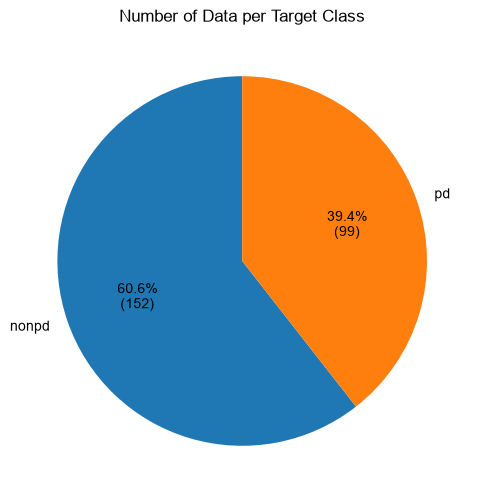

In [6]:
def percent_with_num(values):
    def my_format(pct):
            total = sum(values)
            val = int(round(pct*total/100.0))
            return '{:.1f}%\n({v:d})'.format(pct, v=val)
    return my_format

counts = data["Parkinson's Disease status"].value_counts()

plt.figure(figsize=(6, 6))
plt.pie(counts, labels=counts.index, autopct=percent_with_num(counts), startangle=90)
plt.title("Number of Data per Target Class")

sns.set_style("whitegrid")
sns.despine()
plt.show()

In [7]:
featureset= data.drop("Parkinson's Disease status", axis=1)
label= data["Parkinson's Disease status"]

In [8]:
categorical_cols = featureset.select_dtypes(include='object').columns
feature_encoded = pd.get_dummies(featureset, columns=categorical_cols, prefix=categorical_cols, dtype='int')
feature_encoded

C:\Users\User\AppData\Local\Temp\ipykernel_14820\2186649859.py:1: Pandas4Warning: For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.
  categorical_cols = featureset.select_dtypes(include='object').columns


,Age,1. Mean deviation from centerline when tracing straight line (fraction of screen height),2. Amount of time taken to trace straight line (miliseconds),2.5. Amount of time taken to trace straight line with respect to window width (miliseconds),3. Percentage of points traced inside straight line,3.5. Number of points traced inside straight line with no regard to time taken,4. Amount of time taken to trace sine wave (miliseconds),4.5. Amount of time taken to trace sine wave with respect to window width (miliseconds),5. Percentage of points traced inside sine wave,5.5. Number of points traced inside sine wave with no regard to time taken,...,Race_Black or African American,Race_Native Hawaiian or Other Pacific Islander,Race_Prefer not to specify,Race_White,28 Dominant Hand_Left,28 Dominant Hand_Right,29 Device Type_Desktop,29 Device Type_Linux Desktop,29 Device Type_Mac Desktop,29 Device Type_Windows Desktop
0,61.0,0.023886,500,0.347222,1.000000,1,1000,0.694444,0.500000,1,...,0,1,0,0,1,0,0,0,1,0
1,58.0,-0.000934,1500,1.169135,1.000000,3,3500,2.727981,0.857143,6,...,0,0,0,1,1,0,0,0,0,1
2,67.0,0.018477,10500,5.468750,1.000000,21,25000,13.020833,0.200000,10,...,0,0,0,1,0,1,0,0,0,1
3,61.0,0.002205,1000,0.779423,1.000000,2,3500,2.727981,0.714286,5,...,0,0,0,1,1,0,0,0,0,1
4,62.0,0.102513,3500,1.822917,0.285714,2,16500,8.593750,0.242424,8,...,0,0,0,1,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
246,66.0,0.008034,1500,1.169135,1.000000,3,3000,2.338270,0.666667,4,...,0,0,0,1,1,0,0,0,0,1
247,65.0,0.004795,6000,3.906250,1.000000,12,18000,11.718750,0.916667,33,...,0,0,0,1,0,1,0,0,0,1
248,82.0,-0.009453,11000,7.638889,0.863636,19,17500,12.152778,0.657143,23,...,0,0,0,1,0,1,0,0,1,0
249,64.0,0.005400,3000,2.196193,1.000000,6,15500,11.346999,1.000000,31,...,1,0,0,0,0,1,0,0,0,1


In [9]:
label_encoded = LabelEncoder().fit_transform(label)

In [10]:
X_train, y_train = feature_encoded, label_encoded

In [11]:
import time


def k_fold_validation(model, X, y, n_splits=5):
    skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=57)
    f1 = []
    accuracy = []
    precision_scores = []
    sensitivity = []
    specificity = []
    fpr_list = []
    auc_list = []
    rec_list = []
    auprc_list = []
    inference_time = []

    for fold, (train_index, test_index) in enumerate(skf.split(X, y), 1):
        X_fold_train, X_fold_test = X.iloc[train_index], X.iloc[test_index]
        y_fold_train, y_fold_test = y[train_index], y[test_index]

        numerical_columns = featureset.select_dtypes(include=['int64', 'float64']).columns
        scaler = MinMaxScaler()
        X_fold_train[numerical_columns] = scaler.fit_transform(X_fold_train[numerical_columns])

        model.fit(X_fold_train, y_fold_train)
        
        start_time = time.perf_counter()
        X_fold_test [numerical_columns]= scaler.transform(X_fold_test [numerical_columns])
        y_pred = model.predict(X_fold_test)
        elapsed_time = time.perf_counter() - start_time

        per_participant_time_ms = (
            elapsed_time / len(X_fold_test)
        ) * 1000

        f1.append(f1_score(y_fold_test, y_pred))
        accuracy.append(accuracy_score(y_fold_test, y_pred))
        precision_scores.append(precision_score(y_fold_test, y_pred))
        sensitivity.append(recall_score(y_fold_test, y_pred, pos_label=1))
        specificity.append(recall_score(y_fold_test, y_pred, pos_label=0))
        inference_time.append(per_participant_time_ms)

        y_proba = model.predict_proba(X_fold_test)[:, 1]

        fpr, tpr, _ = roc_curve(y_fold_test, y_proba)
        fpr_interp = np.linspace(0, 1, 100)
        tpr_interp = np.interp(fpr_interp, fpr, tpr)
        fpr_list.append(tpr_interp)
        auc_list.append(auc(fpr, tpr))

        precision, recall, _ = precision_recall_curve(y_fold_test, y_proba)
        recall_interp = np.linspace(0, 1, 100)
        precision_interp = np.interp(recall_interp, recall[::-1], precision[::-1])
        rec_list.append(precision_interp)
        auprc_list.append(auc(recall, precision))

    return {
        'f1_scores': f1, 'accuracy': accuracy, 'precision': precision_scores,
        'sensitivity': sensitivity, 'specificity': specificity,
        'auc': auc_list, 'auprc': auprc_list, 'fpr_list': fpr_list, 'rec_list': rec_list,
        'inference_time': inference_time
    }

In [12]:
def plot_roc_prc_curve(results):
    tpr_array = np.array(results['fpr_list'])
    tpr_mean = tpr_array.mean(axis=0)
    tpr_std = tpr_array.std(axis=0)

    prec_array = np.array(results['rec_list'])
    prec_mean = prec_array.mean(axis=0)
    prec_std = prec_array.std(axis=0)

    fpr_interp = np.linspace(0, 1, 100)
    recall_interp = np.linspace(0, 1, 100)

    mean_auc = np.mean(results['auc'])
    std_auc = np.std(results['auc'])

    mean_auprc = np.mean(results['auprc'])
    std_auprc = np.std(results['auprc'])

    plt.figure(figsize=(12, 5), dpi=1200)

    plt.subplot(1, 2, 1)
    plt.plot(fpr_interp, tpr_mean, color='#1b9e77')
    plt.fill_between(fpr_interp, tpr_mean - tpr_std, tpr_mean + tpr_std, color='#1b9e77', alpha=0.2)
    plt.plot([0, 1], [0, 1], linestyle='--', color='#aaaaaa')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Mean AUROC (5-Fold CV)')

    auroc_handles = [
        Line2D([0], [0], color='#1b9e77', lw=2, label=f'Mean AUROC = {mean_auc:.3f}'),
        Patch(facecolor='#1b9e77', alpha=0.2, label=f'Standard Deviation ± {std_auc:.3f}')
    ]
    plt.legend(handles=auroc_handles, loc='lower right')

    plt.subplot(1, 2, 2)
    plt.plot(recall_interp, prec_mean, color='#d95f02')
    plt.fill_between(recall_interp, prec_mean - prec_std, prec_mean + prec_std, color='#d95f02', alpha=0.2)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title('Mean AUPRC (5-Fold CV)')

    auprc_handles = [
        Line2D([0], [0], color='#d95f02', lw=2, label=f'Mean AUPRC = {mean_auprc:.3f}'),
        Patch(facecolor='#d95f02', alpha=0.2, label=f'Standard Deviation ± {std_auprc:.3f}')
    ]
    plt.legend(handles=auprc_handles, loc='lower left')

    plt.tight_layout()
    plt.show()


In [13]:
base_models = [
    ('catboost', CatBoostClassifier(random_state=57, verbose=False)),
    ('xgboost', XGBClassifier(random_state= 57)),
    ('lightgbm', LGBMClassifier(random_state=57, verbose=-1))
]
meta_learner = LogisticRegression()

In [14]:
cat_model = CatBoostClassifier(random_state=57, verbose=False)
ebm = ExplainableBoostingClassifier(random_state=57)
stacking_clf = StackingClassifier(
    estimators=base_models,
    final_estimator=meta_learner,
    passthrough=True,
    cv=None
)

In [15]:
cat_results = k_fold_validation(cat_model, X_train, y_train)
plot_roc_prc_curve(cat_results)

In [16]:
print(f"Mean Inference Time (CatBoost): {np.mean(cat_results['inference_time']): .2f} ms")

Mean Inference Time (CatBoost):  0.59 ms


In [17]:
ebm_results = k_fold_validation(ebm, X_train, y_train)
plot_roc_prc_curve(ebm_results)

In [18]:
print(f"Mean Inference Time (EBM): {np.mean(ebm_results['inference_time']): .2f} ms")

Mean Inference Time (EBM):  0.48 ms


In [19]:
meta_result = k_fold_validation(stacking_clf, X_train, y_train)
plot_roc_prc_curve(meta_result)

In [20]:
print(f"Mean Inference Time (Meta): {np.mean(meta_result['inference_time']): .2f} ms")

Mean Inference Time (Meta):  1.46 ms


In [36]:
def combine_foldwise_results(result: dict, model:str) -> pd.DataFrame:
    col = ["f1_scores", "accuracy", "precision", "sensitivity", "specificity", "auc"]
    df = pd.DataFrame(result)
    df = df[col]
    df["model"] = model
    df = df.reset_index().rename(columns={"index": "Fold"})
    return df

box_plot_results = pd.DataFrame({})

results = {
    "CatBoost": cat_results,
    "EBM": ebm_results,
    "Meta Learner": meta_result
}

for model, result in results.items():
    model_result = combine_foldwise_results(result, model)
    box_plot_results = pd.concat([box_plot_results, model_result])

In [37]:
box_plot_results

,Fold,f1_scores,accuracy,precision,sensitivity,specificity,auc,model
0,0,0.850000,0.882353,0.850000,0.85,0.903226,0.919355,CatBoost
1,1,0.974359,0.980000,1.000000,0.95,1.000000,0.986667,CatBoost
2,2,0.878049,0.900000,0.857143,0.90,0.900000,0.953333,CatBoost
3,3,0.894737,0.920000,0.944444,0.85,0.966667,0.981667,CatBoost
4,4,0.974359,0.980000,0.950000,1.00,0.967742,0.996604,CatBoost
0,0,0.789474,0.843137,0.833333,0.75,0.903226,0.901613,EBM
1,1,0.871795,0.900000,0.894737,0.85,0.933333,0.988333,EBM
2,2,0.829268,0.860000,0.809524,0.85,0.866667,0.935000,EBM
3,3,0.923077,0.940000,0.947368,0.90,0.966667,0.945000,EBM
4,4,0.974359,0.980000,0.950000,1.00,0.967742,1.000000,EBM


findfont: Failed to find font weight semibold, now using 700.


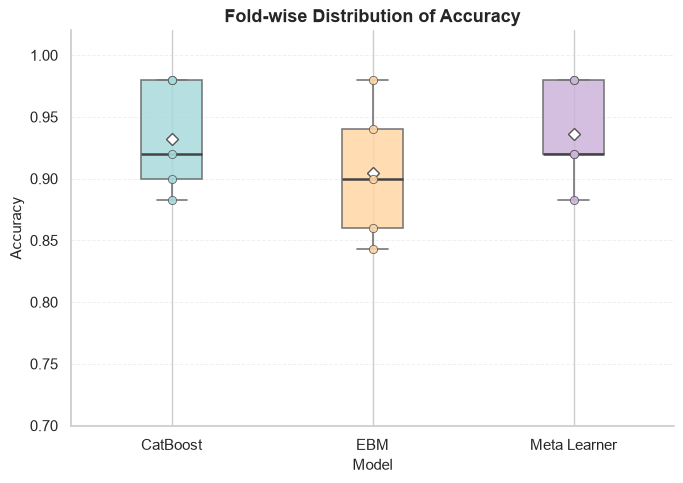

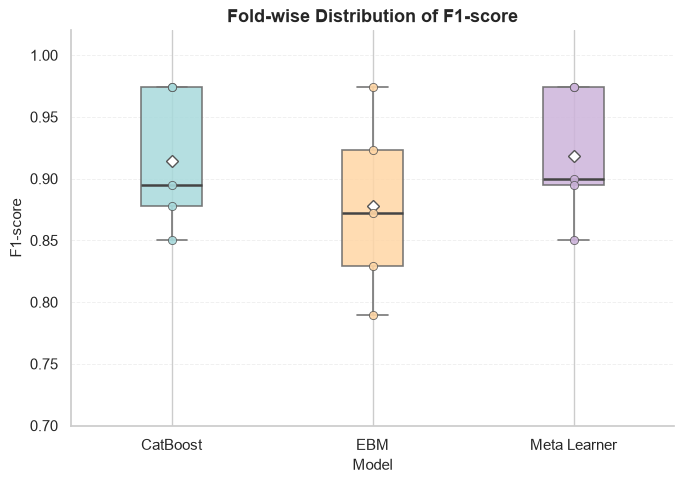

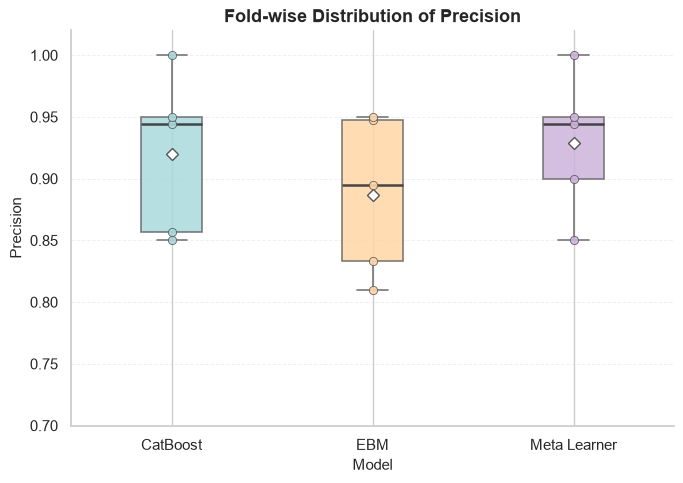

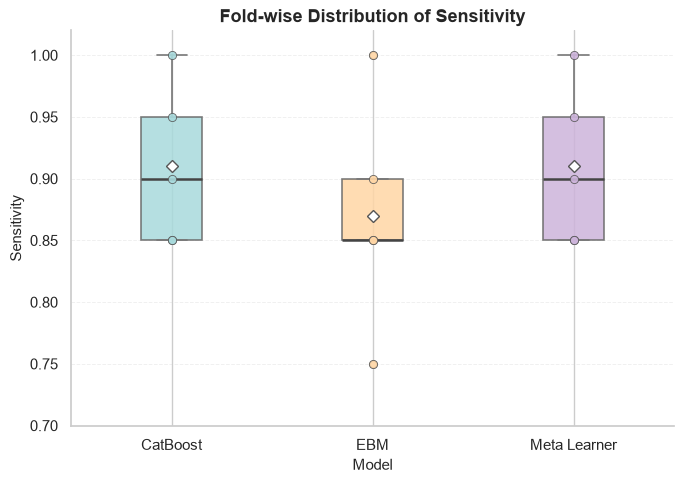

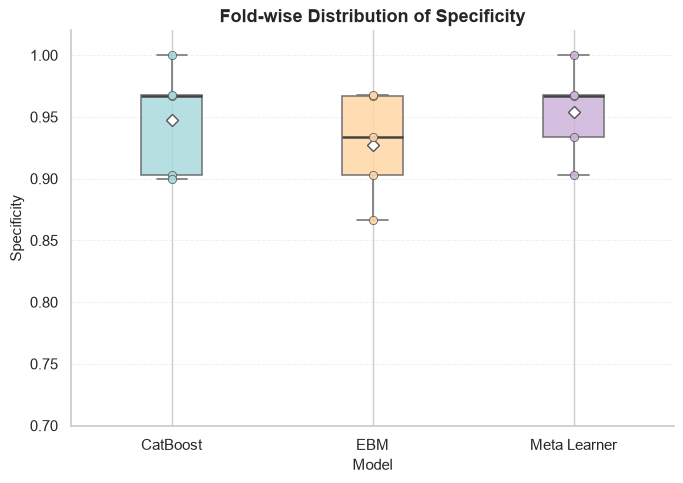

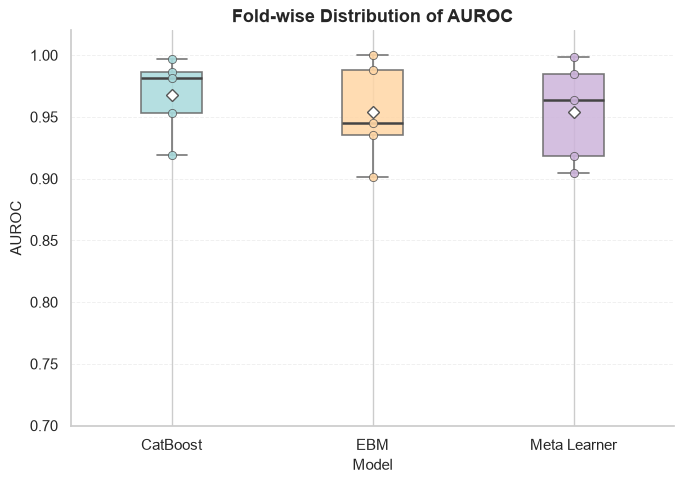

In [41]:
pastel_colors = ["#A8DADC", "#FFD6A5", "#CDB4DB"]

metrics = [
    "Accuracy",
    "F1-score",
    "Precision",
    "Sensitivity",
    "Specificity",
    "AUROC"
]

model_order = ["CatBoost", "EBM", "Meta Learner"]

for metric in metrics:
    plot_data = [
        box_plot_results.loc[box_plot_results["Model"] == model, metric].dropna().values
        for model in model_order
    ]

    fig, ax = plt.subplots(figsize=(7, 5))

    boxplot = ax.boxplot(
        plot_data,
        tick_labels=model_order,
        patch_artist=True,
        showmeans=True,
        meanprops={
            "marker": "D",
            "markerfacecolor": "white",
            "markeredgecolor": "#555555",
            "markersize": 6
        },
        medianprops={
            "color": "#444444",
            "linewidth": 1.8
        },
        whiskerprops={
            "color": "#777777",
            "linewidth": 1.2
        },
        capprops={
            "color": "#777777",
            "linewidth": 1.2
        },
        flierprops={
            "marker": "o",
            "markerfacecolor": "white",
            "markeredgecolor": "#777777",
            "markersize": 5
        }
    )

    # Apply pastel colors
    for patch, color in zip(boxplot["boxes"], pastel_colors):
        patch.set_facecolor(color)
        patch.set_edgecolor("#666666")
        patch.set_linewidth(1.2)
        patch.set_alpha(0.85)

    # Add individual fold values
    for position, (values, color) in enumerate(
        zip(plot_data, pastel_colors),
        start=1
    ):
        ax.scatter(
            [position] * len(values),
            values,
            s=35,
            color=color,
            edgecolor="#555555",
            linewidth=0.6,
            alpha=0.9,
            zorder=3
        )

    ax.set_xlabel("Model", fontsize=11)
    ax.set_ylabel(metric, fontsize=11)
    ax.set_title(
        f"Fold-wise Distribution of {metric}",
        fontsize=13,
        fontweight="semibold"
    )

    ax.set_ylim(0.70, 1.02)
    ax.grid(
        axis="y",
        linestyle="--",
        linewidth=0.7,
        alpha=0.3
    )

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    plt.tight_layout()
    plt.show()

In [69]:
import matplotlib.pyplot as plt

# Rename columns for cleaner labels
box_plot_results = box_plot_results.rename(
    columns={
        "f1_scores": "F1-score",
        "accuracy": "Accuracy",
        "precision": "Precision",
        "sensitivity": "Sensitivity",
        "specificity": "Specificity",
        "auc": "AUROC",
        "model": "Model"
    }
)

metrics = [
    "Accuracy",
    "F1-score",
    "Precision",
    "Sensitivity",
    "Specificity",
    "AUROC"
]

model_order = ["CatBoost", "EBM", "Meta Learner"]

pastel_colors = [
    "#A8DADC",  # pastel blue
    "#FFD6A5",  # pastel peach
    "#CDB4DB"   # pastel lavender
]

# 2 rows × 3 columns, shared y-axis
fig, axes = plt.subplots(
    nrows=2,
    ncols=3,
    figsize=(20, 8),
    sharey=True,
    dpi=600
)

axes = axes.flatten()

fig.subplots_adjust(
    left=0.08,
    right=0.98,
    bottom=0.10,
    top=0.90,
    wspace=0.15,   # space between columns
    hspace=0.50    # space between rows
)

for ax, metric in zip(axes, metrics):

    plot_data = [
        box_plot_results.loc[box_plot_results["Model"] == model, metric].dropna().values
        for model in model_order
    ]

    boxplot = ax.boxplot(
        plot_data,
        tick_labels=model_order,
        patch_artist=True,
        widths=0.55,
        showmeans=True,
        meanprops={
            "marker": "D",
            "markerfacecolor": "white",
            "markeredgecolor": "#555555",
            "markersize": 5
        },
        medianprops={
            "color": "#444444",
            "linewidth": 1.6
        },
        whiskerprops={
            "color": "#777777",
            "linewidth": 1.1
        },
        capprops={
            "color": "#777777",
            "linewidth": 1.1
        },
        flierprops={
            "marker": "o",
            "markerfacecolor": "white",
            "markeredgecolor": "#777777",
            "markersize": 4
        }
    )

    # Color each model's box
    for patch, color in zip(boxplot["boxes"], pastel_colors):
        patch.set_facecolor(color)
        patch.set_edgecolor("#666666")
        patch.set_linewidth(1.1)
        patch.set_alpha(0.9)

    # Add individual fold values
    for position, (values, color) in enumerate(
        zip(plot_data, pastel_colors),
        start=1
    ):
        ax.scatter(
            [position] * len(values),
            values,
            s=28,
            color=color,
            edgecolor="#555555",
            linewidth=0.5,
            alpha=0.9,
            zorder=3
        )

    ax.set_title(metric, fontsize=12, fontweight=700, pad=30)
    ax.set_ylim(0.70, 1.02)
    ax.grid(
        axis="y",
        linestyle="--",
        linewidth=0.6,
        alpha=0.4
    )

    ax.tick_params(axis="x")

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

# One shared y-axis label
fig.supylabel(
    "Performance score",
    fontsize=12,
    x=0.04
)

fig.supxlabel(
    "Machine-learning model",
    fontsize=12,
    y=0.02
)

fig.suptitle(
    "Fold-wise Distribution of Model Performance",
    fontsize=15,
    fontweight="semibold",
    y=1.05
)


plt.show()

In [30]:
def plot_bar_chart(all_results):
    models = list(all_results.keys())

    mean_f1 = [np.mean(results['f1_scores']) for results in all_results.values()]
    std_f1 = [np.std(results['f1_scores']) for results in all_results.values()]
    mean_auc = [np.mean(results['auc']) for results in all_results.values()]
    std_auc = [np.std(results['auc']) for results in all_results.values()]
    mean_accuracy = [np.mean(results['accuracy']) for results in all_results.values()]
    std_accuracy = [np.std(results['accuracy']) for results in all_results.values()]
    mean_precision = [np.mean(results['precision']) for results in all_results.values()]
    std_precision = [np.std(results['precision']) for results in all_results.values()]
    mean_sensitivity = [np.mean(results['sensitivity']) for results in all_results.values()]
    std_sensitivity = [np.std(results['sensitivity']) for results in all_results.values()]
    mean_specificity = [np.mean(results['specificity']) for results in all_results.values()]
    std_specificity = [np.std(results['specificity']) for results in all_results.values()]
    mean_inference = [np.std(results['inference_time']) for results in all_results.values()]

    metric_dataframes = [
        pd.DataFrame({"Metric": "F1 Score", "Algorithms": models, "Mean": mean_f1, "Std": std_f1}),
        pd.DataFrame({"Metric": "Accuracy", "Algorithms": models, "Mean": mean_accuracy, "Std": std_accuracy}),
        pd.DataFrame({"Metric": "Precision", "Algorithms": models, "Mean": mean_precision, "Std": std_precision}),
        pd.DataFrame({"Metric": "Sensitivity", "Algorithms": models, "Mean": mean_sensitivity, "Std": std_sensitivity}),
        pd.DataFrame({"Metric": "Specificity", "Algorithms": models, "Mean": mean_specificity, "Std": std_specificity}),
    ]

    metrics_df = pd.concat(metric_dataframes, ignore_index=True)

    model_colors = {
        "CatBoost": "#8da8d3",
        "EBM": "#a1d99b",
        "Meta Learner": "#f6c969"
    }

    sns.set(style="whitegrid")
    plt.figure(figsize=(15, 6), dpi=1200)

    ax = sns.barplot(
        data=metrics_df,
        y="Metric",
        x="Mean",
        hue="Algorithms",
        palette=model_colors,
        errorbar=None
    )

    for i, row in metrics_df.iterrows():
        x = row["Mean"]
        xerr = row["Std"]
        metric_index = list(metrics_df["Metric"].unique()).index(row["Metric"])
        group_offset = -0.3 + 0.6 * models.index(row["Algorithms"]) / max(len(models) - 1, 1)
        y = metric_index + group_offset
        ax.errorbar(x, y, xerr=xerr, fmt='none', ecolor='black', capsize=2, lw=0.8)

        ax.annotate(f"{x:.4f} ± {xerr:.4f}",
                    (x + xerr + 0.005, y),
                    va='center', ha='left', fontsize=8)

    plt.title("Comparison of Models across Multiple Metrics")
    plt.xlabel("Score")
    plt.ylabel("Metrics")
    plt.xlim(0, metrics_df["Mean"].max() + metrics_df["Std"].max() + 0.05)
    plt.xticks(np.arange(0, 1.01, 0.1))

    plt.legend(title="Algorithms", loc='lower left', frameon=True)
    plt.tight_layout()
    plt.show()


In [31]:
all_results = {
    'CatBoost': cat_results,
    'EBM': ebm_results,
    'Meta Learner': meta_result
}

plot_bar_chart(all_results)

#### **Statistical Analysis of Feature Space**

In [23]:
metadata_columns = [
    "Age",
    "Gender",
    "Race",
    "27 Participant Height",
    "28 Dominant Hand",
    "29 Device Type",
]


existing_metadata = [
    column for column in metadata_columns
    if column in featureset.columns
]

print("Excluded metadata columns:")
for column in existing_metadata:
    print(" -", column)

missing_metadata = [
    column for column in metadata_columns
    if column not in featureset.columns
]

if missing_metadata:
    print("\nMetadata names not found exactly:")
    for column in missing_metadata:
        print(" -", column)

Excluded metadata columns:
 - Age
 - Gender
 - Race
 - 27 Participant Height
 - 28 Dominant Hand
 - 29 Device Type


In [24]:
X_raw = featureset.drop(columns=existing_metadata, errors="ignore").copy()
y_raw = label.copy()

print("Raw feature matrix shape:", X_raw.shape)

Raw feature matrix shape: (251, 73)


In [25]:
X_numeric = X_raw.apply(pd.to_numeric, errors="coerce")

conversion_summary = pd.DataFrame({
    "original_non_missing": X_raw.notna().sum(),
    "numeric_non_missing": X_numeric.notna().sum(),
})

conversion_summary["values_lost_during_conversion"] = (
    conversion_summary["original_non_missing"]
    - conversion_summary["numeric_non_missing"]
)

problematic_columns = conversion_summary[
    conversion_summary["values_lost_during_conversion"] > 0
].sort_values(
    "values_lost_during_conversion",
    ascending=False
)

if problematic_columns.empty:
    print("All extracted feature columns were successfully interpreted as numeric.")
else:
    print("Columns containing nonnumeric values:")
    display(problematic_columns)

All extracted feature columns were successfully interpreted as numeric.


In [26]:
for column in problematic_columns.index[:10]:
    bad_mask = (
        X_raw[column].notna()
        & pd.to_numeric(X_raw[column], errors="coerce").isna()
    )

    print(f"\nColumn: {column}")
    print("Problematic values:", X_raw.loc[bad_mask, column].unique()[:10])

In [27]:
valid_target_mask = y_raw.notna()

X_numeric = X_numeric.loc[valid_target_mask].reset_index(drop=True)
y = y_raw.loc[valid_target_mask].astype(str).str.strip().reset_index(drop=True)

print("Remaining participants:", len(y))
print(y.value_counts())

Remaining participants: 251
Parkinson's Disease status
nonpd    152
pd        99
Name: count, dtype: int64


In [28]:
infinite_count = np.isinf(X_numeric.to_numpy(dtype=float, na_value=np.nan)).sum()

print("Number of infinite values:", infinite_count)

X_numeric = X_numeric.replace([np.inf, -np.inf], np.nan)

Number of infinite values: 0


In [29]:
missing_summary = pd.DataFrame({
    "missing_count": X_numeric.isna().sum(),
    "missing_percentage": X_numeric.isna().mean() * 100,
}).sort_values("missing_percentage", ascending=False)

display(missing_summary.head(20))

,missing_count,missing_percentage
1. Mean deviation from centerline when tracing straight line (fraction of screen height),0,0.0
2. Amount of time taken to trace straight line (miliseconds),0,0.0
2.5. Amount of time taken to trace straight line with respect to window width (miliseconds),0,0.0
3. Percentage of points traced inside straight line,0,0.0
3.5. Number of points traced inside straight line with no regard to time taken,0,0.0
4. Amount of time taken to trace sine wave (miliseconds),0,0.0
4.5. Amount of time taken to trace sine wave with respect to window width (miliseconds),0,0.0
5. Percentage of points traced inside sine wave,0,0.0
5.5. Number of points traced inside sine wave with no regard to time taken,0,0.0
6. Amount of time taken to trace spiral (miliseconds),0,0.0


In [30]:
all_missing_columns = X_numeric.columns[X_numeric.isna().all()].tolist()

if all_missing_columns:
    print("Removing completely empty columns:")
    for column in all_missing_columns:
        print(" -", column)

    X_numeric = X_numeric.drop(columns=all_missing_columns)

print("Shape after removing fully missing columns:", X_numeric.shape)

Shape after removing fully missing columns: (251, 73)


In [31]:
MAX_MISSING_PROPORTION = 0.40

high_missing_columns = X_numeric.columns[
    X_numeric.isna().mean() > MAX_MISSING_PROPORTION
].tolist()

print(f"Features with more than {MAX_MISSING_PROPORTION:.0%} missingness:")
for column in high_missing_columns:
    print(" -", column)

X_filtered = X_numeric.drop(columns=high_missing_columns)

print("Shape after missingness filtering:", X_filtered.shape)

Features with more than 40% missingness:
Shape after missingness filtering: (251, 73)


In [32]:
from sklearn.impute import SimpleImputer


imputer = SimpleImputer(strategy="median")

X_imputed_array = imputer.fit_transform(X_filtered)

X_imputed = pd.DataFrame(
    X_imputed_array,
    columns=X_filtered.columns,
    index=X_filtered.index,
)

print("Remaining missing values:", X_imputed.isna().sum().sum())
print("Imputed feature matrix shape:", X_imputed.shape)

Remaining missing values: 0
Imputed feature matrix shape: (251, 73)


In [33]:
from sklearn.feature_selection import VarianceThreshold


variance_filter = VarianceThreshold(threshold=0.0)

X_variable_array = variance_filter.fit_transform(X_imputed)

retained_mask = variance_filter.get_support()
retained_features = X_imputed.columns[retained_mask].tolist()
removed_constant_features = X_imputed.columns[~retained_mask].tolist()

X_variable = pd.DataFrame(
    X_variable_array,
    columns=retained_features,
    index=X_imputed.index,
)

print("Retained features:", X_variable.shape[1])
print("Removed constant features:", len(removed_constant_features))

if removed_constant_features:
    print("\nConstant features removed:")
    for column in removed_constant_features:
        print(" -", column)

Retained features: 73
Removed constant features: 0


In [34]:
from sklearn.preprocessing import StandardScaler


scaler = StandardScaler()

X_scaled_array = scaler.fit_transform(X_variable)

X_scaled = pd.DataFrame(
    X_scaled_array,
    columns=X_variable.columns,
    index=X_variable.index,
)

print("Scaled matrix shape:", X_scaled.shape)

scaling_check = pd.DataFrame({
    "mean_after_scaling": X_scaled.mean(),
    "std_after_scaling": X_scaled.std(ddof=0),
})

display(scaling_check.head())

Scaled matrix shape: (251, 73)


,mean_after_scaling,std_after_scaling
1. Mean deviation from centerline when tracing straight line (fraction of screen height),3.538559e-18,1.0
2. Amount of time taken to trace straight line (miliseconds),2.123136e-17,1.0
2.5. Amount of time taken to trace straight line with respect to window width (miliseconds),-1.238496e-17,1.0
3. Percentage of points traced inside straight line,3.538559e-18,1.0
3.5. Number of points traced inside straight line with no regard to time taken,-1.769280e-17,1.0


In [35]:
from sklearn.decomposition import PCA


pca = PCA(
    n_components=0.95,
    svd_solver="full",
)

X_pca = pca.fit_transform(X_scaled)

print("Original standardized dimensions:", X_scaled.shape[1])
print("PCA dimensions retained:", X_pca.shape[1])
print(
    "Total explained variance:",
    f"{pca.explained_variance_ratio_.sum():.2%}")

Original standardized dimensions: 73
PCA dimensions retained: 23
Total explained variance: 95.10%


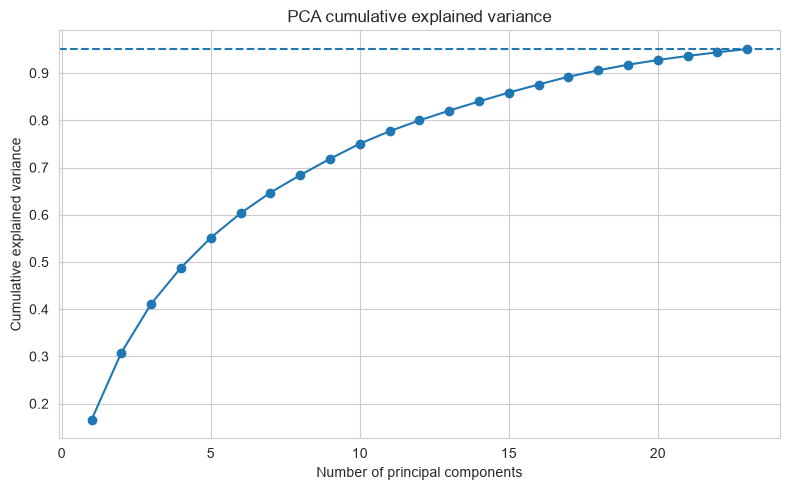

In [36]:
cumulative_variance = np.cumsum(pca.explained_variance_ratio_)

plt.figure(figsize=(8, 5))
plt.plot(
    range(1, len(cumulative_variance) + 1),
    cumulative_variance,
    marker="o",
)
plt.axhline(0.95, linestyle="--")
plt.xlabel("Number of principal components")
plt.ylabel("Cumulative explained variance")
plt.title("PCA cumulative explained variance")
plt.tight_layout()
plt.show()

In [37]:
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_scaled)

pca_plot_df = pd.DataFrame({
    "PC1": X_pca_2d[:, 0],
    "PC2": X_pca_2d[:, 1],
    "PD_status": y,
})

print(
    "Variance explained by PC1:",
    f"{pca_2d.explained_variance_ratio_[0]:.2%}"
)
print(
    "Variance explained by PC2:",
    f"{pca_2d.explained_variance_ratio_[1]:.2%}"
)

Variance explained by PC1: 16.61%
Variance explained by PC2: 14.21%


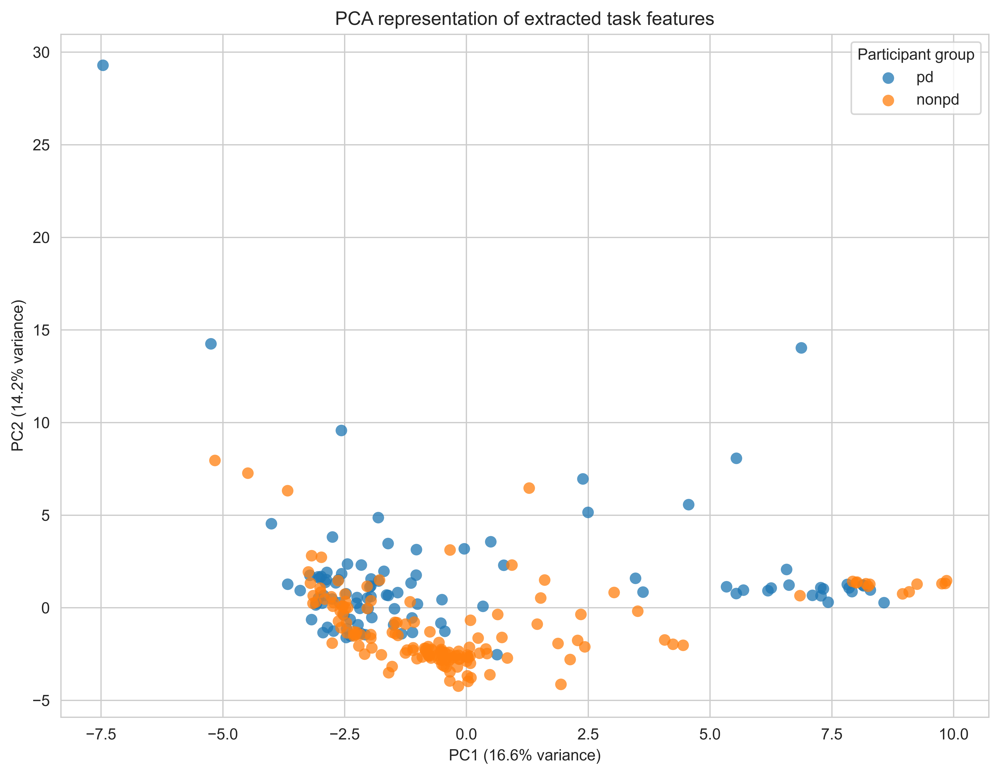

In [38]:
plt.figure(figsize=(9, 7), dpi=600)

for group in pca_plot_df["PD_status"].unique():
    group_data = pca_plot_df[
        pca_plot_df["PD_status"] == group
    ]

    plt.scatter(
        group_data["PC1"],
        group_data["PC2"],
        label=group,
        alpha=0.75,
        s=55,
        edgecolors="none",
    )

plt.xlabel(
    f"PC1 ({pca_2d.explained_variance_ratio_[0]:.1%} variance)"
)
plt.ylabel(
    f"PC2 ({pca_2d.explained_variance_ratio_[1]:.1%} variance)"
)
plt.title("PCA representation of extracted task features")
plt.legend(title="Participant group")
plt.tight_layout()
plt.show()

In [26]:
pc1_top_features = (
    loadings.loc[
        loadings["PC1"].abs().sort_values(ascending=False).head(10).index,
        "PC1"
    ]
)

pc2_top_features = (
    loadings.loc[
        loadings["PC2"].abs().sort_values(ascending=False).head(10).index,
        "PC2"
    ]
)

print("PC1 loadings:")
display(pc1_top_features.to_frame())

print("PC2 loadings:")
display(pc2_top_features.to_frame())

PC1 loadings:


,PC1
26.2 Total Wrong clicks,0.260172
25.1 Mean Right Clicks,-0.260172
26.1 Mean Wrong clicks,0.260172
25.2 Total Right Clicks,-0.260172
mean_false_presses_over_total_key_presses,0.245016
15. Number of correctly pressed keys when prompted with a semi-random(random between 2 letters) key,-0.241543
14. Number of correctly pressed keys when prompted with a constant key,-0.240809
false_presses_over_total_key_presses_semi-random_key,0.234521
false_presses_over_total_key_presses_constant_key,0.232995
16. Number of correctly pressed keys when prompted with a random key,-0.231914


PC2 loadings:


,PC2
mean_of_total_amount_of_time_taken_to_trace_lines,0.275610
mean_of_total_amount_of_time_taken_to_trace_lines_with_respect_to_window_width,0.267648
7.5 Percentage of points traced inside spiral with no regard to time taken,0.262848
mean_of_total_Number_of_points_to_traced_inside_line_with_no_regard_to_time_taken,0.260579
4. Amount of time taken to trace sine wave (miliseconds),0.249106
2.5. Amount of time taken to trace straight line with respect to window width (miliseconds),0.245892
6. Amount of time taken to trace spiral (miliseconds),0.245519
4.5. Amount of time taken to trace sine wave with respect to window width (miliseconds),0.245450
5.5. Number of points traced inside sine wave with no regard to time taken,0.230629
6.5. Amount of time taken to trace spiral with respect to window width (miliseconds),0.224872


In [39]:
n_samples = X_pca.shape[0]

DEFAULT_PERPLEXITY = 30
perplexity = min(DEFAULT_PERPLEXITY, n_samples - 1)

if perplexity < 5:
    raise ValueError(
        "There are too few participants for a meaningful t-SNE analysis."
    )

print("Number of participants:", n_samples)
print("Selected perplexity:", perplexity)

Number of participants: 251
Selected perplexity: 30


In [40]:
from sklearn.manifold import TSNE


tsne = TSNE(
    n_components=2,
    perplexity=perplexity,
    learning_rate="auto",
    init="pca",
    max_iter=2000,
    metric="euclidean",
    random_state=42,
)

X_tsne = tsne.fit_transform(X_pca)

print("t-SNE output shape:", X_tsne.shape)
print("Final KL divergence:", tsne.kl_divergence_)

t-SNE output shape: (251, 2)
Final KL divergence: 0.36581727862358093


In [41]:
tsne_df = pd.DataFrame({
    "tSNE_1": X_tsne[:, 0],
    "tSNE_2": X_tsne[:, 1],
    "PD_status": y,
})

# if "Session ID" in df.columns:
#     tsne_df.insert(
#         0,
#         "Session ID",
#         df.loc[valid_target_mask, "Session ID"].reset_index(drop=True),
#     )

display(tsne_df.head())

,tSNE_1,tSNE_2,PD_status
0,6.478880,-5.377800,pd
1,-17.098478,-2.422837,nonpd
2,-17.247480,0.328751,pd
3,-9.103128,6.153411,nonpd
4,14.068693,-7.503394,pd


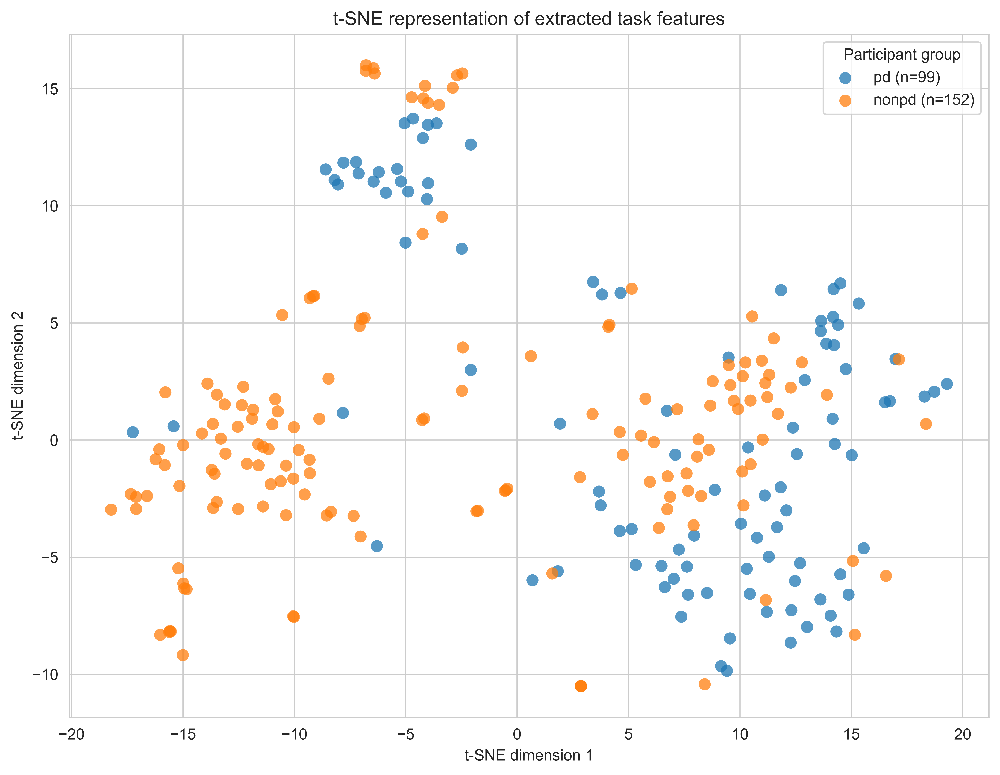

In [42]:
plt.figure(figsize=(9, 7), dpi=600)

for group in tsne_df["PD_status"].unique():
    group_data = tsne_df[
        tsne_df["PD_status"] == group
    ]

    plt.scatter(
        group_data["tSNE_1"],
        group_data["tSNE_2"],
        label=f"{group} (n={len(group_data)})",
        alpha=0.75,
        s=60,
        edgecolors="none",
    )

plt.xlabel("t-SNE dimension 1")
plt.ylabel("t-SNE dimension 2")
plt.title("t-SNE representation of extracted task features")
plt.legend(title="Participant group")
plt.tight_layout()
plt.show()

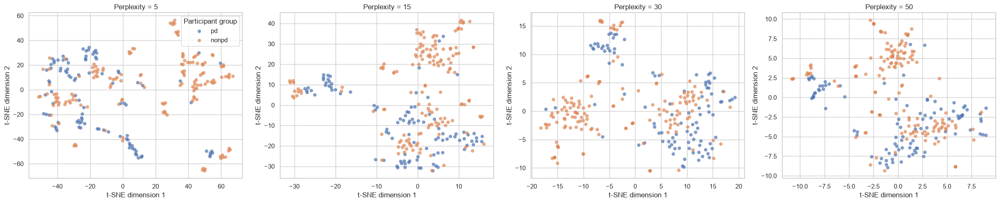

In [69]:
perplexity_values = [5, 15, 30, 50]

perplexity_values = [
    value for value in perplexity_values
    if value < len(y)
]

fig, axes = plt.subplots(
    1,
    len(perplexity_values),
    figsize=(6 * len(perplexity_values), 5),
)

if len(perplexity_values) == 1:
    axes = [axes]

for axis, current_perplexity in zip(
    axes,
    perplexity_values,
):
    current_tsne = TSNE(
        n_components=2,
        perplexity=current_perplexity,
        learning_rate="auto",
        init="pca",
        max_iter=2000,
        metric="euclidean",
        random_state=42,
    )

    current_embedding = current_tsne.fit_transform(X_pca)

    current_plot_df = pd.DataFrame({
        "x": current_embedding[:, 0],
        "y": current_embedding[:, 1],
        "group": y,
    })

    for group in current_plot_df["group"].unique():
        group_data = current_plot_df[
            current_plot_df["group"] == group
        ]

        axis.scatter(
            group_data["x"],
            group_data["y"],
            label=group,
            alpha=0.70,
            s=35,
            edgecolors="none",
        )

    axis.set_title(f"Perplexity = {current_perplexity}")
    axis.set_xlabel("t-SNE dimension 1")
    axis.set_ylabel("t-SNE dimension 2")

axes[0].legend(title="Participant group")
plt.tight_layout()
plt.show()

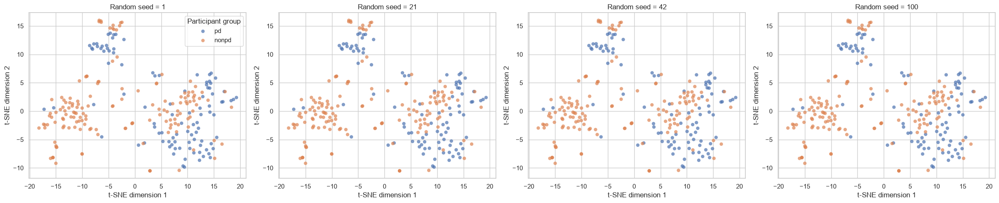

In [70]:
random_seeds = [1, 21, 42, 100]

fig, axes = plt.subplots(
    1,
    len(random_seeds),
    figsize=(6 * len(random_seeds), 5),
)

if len(random_seeds) == 1:
    axes = [axes]

for axis, seed in zip(axes, random_seeds):
    current_tsne = TSNE(
        n_components=2,
        perplexity=30,
        learning_rate="auto",
        init="pca",
        max_iter=2000,
        metric="euclidean",
        random_state=seed,
    )

    current_embedding = current_tsne.fit_transform(X_pca)

    current_plot_df = pd.DataFrame({
        "x": current_embedding[:, 0],
        "y": current_embedding[:, 1],
        "group": y,
    })

    for group in current_plot_df["group"].unique():
        group_data = current_plot_df[
            current_plot_df["group"] == group
        ]

        axis.scatter(
            group_data["x"],
            group_data["y"],
            label=group,
            alpha=0.70,
            s=35,
            edgecolors="none",
        )

    axis.set_title(f"Random seed = {seed}")
    axis.set_xlabel("t-SNE dimension 1")
    axis.set_ylabel("t-SNE dimension 2")

axes[0].legend(title="Participant group")
plt.tight_layout()
plt.show()

In [71]:
metadata_for_plotting = [
    "Age",
    "Gender",
    "Race",
    "28 Dominant Hand",
    "29 Device Type",
]

for column in metadata_for_plotting:
    if column in featureset.columns:
        tsne_df[column] = (
            featureset.loc[valid_target_mask, column]
            .reset_index(drop=True)
        )

display(tsne_df.head())

,tSNE_1,tSNE_2,PD_status,Age,Gender,Race,28 Dominant Hand,29 Device Type
0,6.478880,-5.377800,pd,61.0,Male,Native Hawaiian or Other Pacific Islander,Left,Mac Desktop
1,-17.098478,-2.422837,nonpd,58.0,Male,White,Left,Windows Desktop
2,-17.247480,0.328751,pd,67.0,Female,White,Right,Windows Desktop
3,-9.103128,6.153411,nonpd,61.0,Male,White,Left,Windows Desktop
4,14.068693,-7.503394,pd,62.0,Male,White,Right,Windows Desktop


In [72]:
def plot_tsne_by_category(
    data: pd.DataFrame,
    category_column: str,
    title: str | None = None,
) -> None:
    """
    Plot existing t-SNE coordinates colored by a categorical variable.
    """
    if category_column not in data.columns:
        raise KeyError(
            f"Column '{category_column}' is not available."
        )

    plot_data = data.copy()
    plot_data[category_column] = (
        plot_data[category_column]
        .fillna("Missing")
        .astype(str)
    )

    plt.figure(figsize=(9, 7))

    for category in plot_data[category_column].unique():
        group_data = plot_data[
            plot_data[category_column] == category
        ]

        plt.scatter(
            group_data["tSNE_1"],
            group_data["tSNE_2"],
            label=f"{category} (n={len(group_data)})",
            alpha=0.75,
            s=60,
            edgecolors="none",
        )

    plt.xlabel("t-SNE dimension 1")
    plt.ylabel("t-SNE dimension 2")
    plt.title(
        title
        if title is not None
        else f"t-SNE representation by {category_column}"
    )
    plt.legend(
        title=category_column,
        bbox_to_anchor=(1.02, 1),
        loc="upper left",
    )
    plt.tight_layout()
    plt.show()

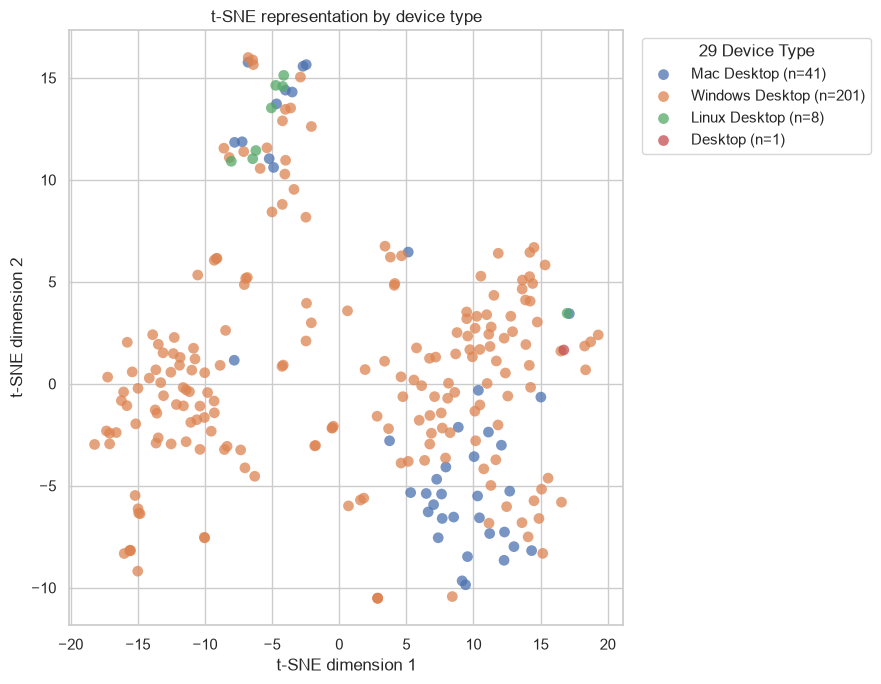

In [73]:
plot_tsne_by_category(
    tsne_df,
    category_column="29 Device Type",
    title="t-SNE representation by device type",
)

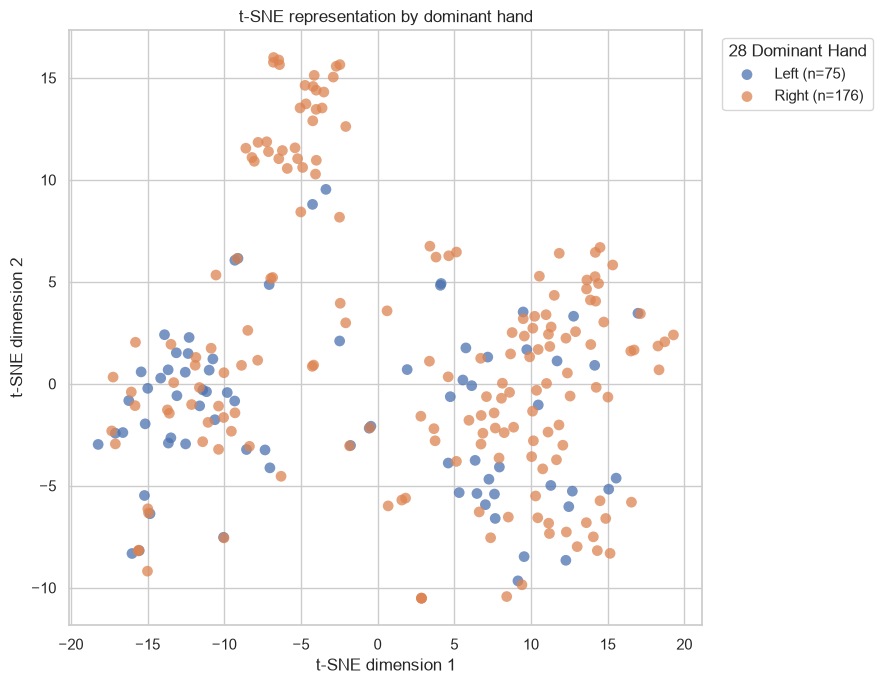

In [74]:
plot_tsne_by_category(
    tsne_df,
    category_column="28 Dominant Hand",
    title="t-SNE representation by dominant hand",
)

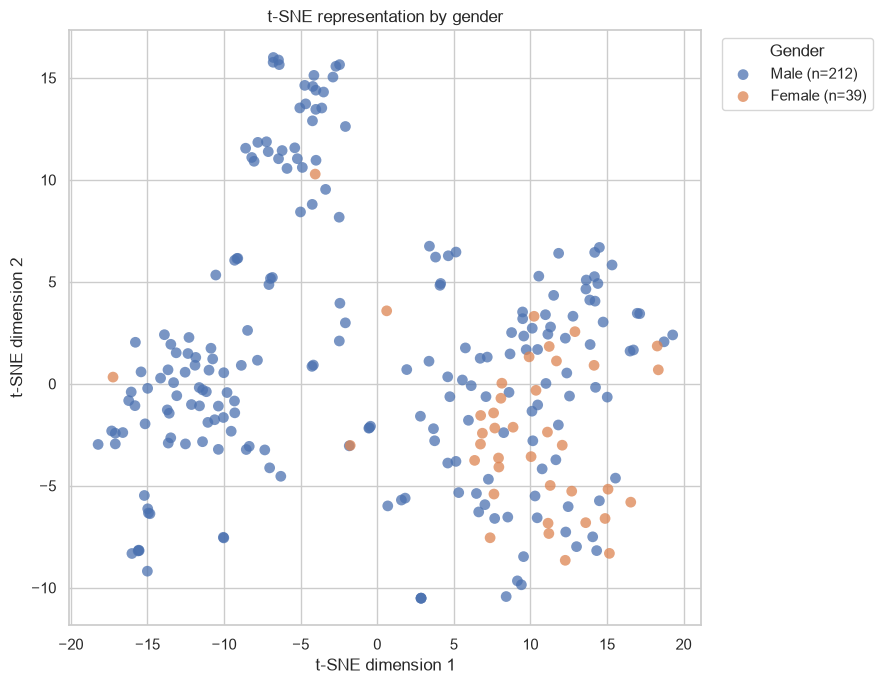

In [75]:
plot_tsne_by_category(
    tsne_df,
    category_column="Gender",
    title="t-SNE representation by gender",
)

In [76]:
def columns_matching_keywords(
    columns: list[str],
    keywords: list[str],
) -> list[str]:
    """
    Return columns containing at least one keyword, ignoring case.
    """
    matches = []

    for column in columns:
        lower_column = column.lower()

        if any(
            keyword.lower() in lower_column
            for keyword in keywords
        ):
            matches.append(column)

    return matches

In [78]:
mouse_tracing_features = columns_matching_keywords(
    X_variable.columns.tolist(),
    [
        "straight line",
        "sine",
        "spiral",
        "centerline",
        "points traced",
        "trace lines",
    ],
)

keyboard_features = columns_matching_keywords(
    X_variable.columns.tolist(),
    [
        "false press",
        "correctly pressed",
        "prompted with",
        "pressing p",
        "pressing q",
    ],
)

click_reaction_features = columns_matching_keywords(
    X_variable.columns.tolist(),
    [
        "clicking box",
        "reaction time",
        "right clicks",
        "wrong clicks",
        "box clicks",
    ],
)

print("Mouse-tracing features:", len(mouse_tracing_features))
for column in mouse_tracing_features:
    print(" -", column)

print("\nKeyboard features:", len(keyboard_features))
for column in keyboard_features:
    print(" -", column)

print("\nClick/reaction-time features:", len(click_reaction_features))
for column in click_reaction_features:
    print(" -", column)

Mouse-tracing features: 23
 - 1. Mean deviation from centerline when tracing straight line (fraction of screen height)
 - 2. Amount of time taken to trace straight line (miliseconds)
 - 2.5. Amount of time taken to trace straight line with respect to window width (miliseconds)
 - 3. Percentage of points traced inside straight line
 - 3.5. Number of points traced inside straight line with no regard to time taken
 - 4. Amount of time taken to trace sine wave (miliseconds)
 - 4.5. Amount of time taken to trace sine wave with respect to window width (miliseconds)
 - 5. Percentage of points traced inside sine wave
 - 5.5. Number of points traced inside sine wave with no regard to time taken
 - 6. Amount of time taken to trace spiral (miliseconds)
 - 6.5. Amount of time taken to trace spiral with respect to window width (miliseconds)
 - 7. Percentage of points traced inside spiral
 - 7.5 Percentage of points traced inside spiral with no regard to time taken
 - 17. Maximum deviation from cent

In [79]:
def calculate_tsne_for_feature_subset(
    data: pd.DataFrame,
    labels: pd.Series,
    feature_names: list[str],
    perplexity: float = 30,
    random_state: int = 42,
) -> pd.DataFrame:
    """
    Preprocess a selected set of features and calculate a 2D t-SNE embedding.
    """
    available_features = [
        column for column in feature_names
        if column in data.columns
    ]

    if len(available_features) < 2:
        raise ValueError(
            "At least two valid features are required."
        )

    subset = data[available_features].copy()
    subset = subset.replace([np.inf, -np.inf], np.nan)

    imputer = SimpleImputer(strategy="median")
    subset_imputed = imputer.fit_transform(subset)

    variance_filter = VarianceThreshold(threshold=0.0)
    subset_variable = variance_filter.fit_transform(
        subset_imputed
    )

    scaler = StandardScaler()
    subset_scaled = scaler.fit_transform(subset_variable)

    n_components = min(
        50,
        subset_scaled.shape[1],
        subset_scaled.shape[0] - 1,
    )

    if n_components >= 2:
        pca = PCA(
            n_components=n_components,
            random_state=random_state,
        )
        subset_reduced = pca.fit_transform(subset_scaled)
    else:
        subset_reduced = subset_scaled

    valid_perplexity = min(
        perplexity,
        len(labels) - 1,
    )

    model = TSNE(
        n_components=2,
        perplexity=valid_perplexity,
        learning_rate="auto",
        init="pca",
        max_iter=2000,
        random_state=random_state,
    )

    embedding = model.fit_transform(subset_reduced)

    return pd.DataFrame({
        "tSNE_1": embedding[:, 0],
        "tSNE_2": embedding[:, 1],
        "PD_status": labels.reset_index(drop=True),
    })

In [80]:
mouse_tsne_df = calculate_tsne_for_feature_subset(
    data=X_numeric,
    labels=y,
    feature_names=mouse_tracing_features,
)

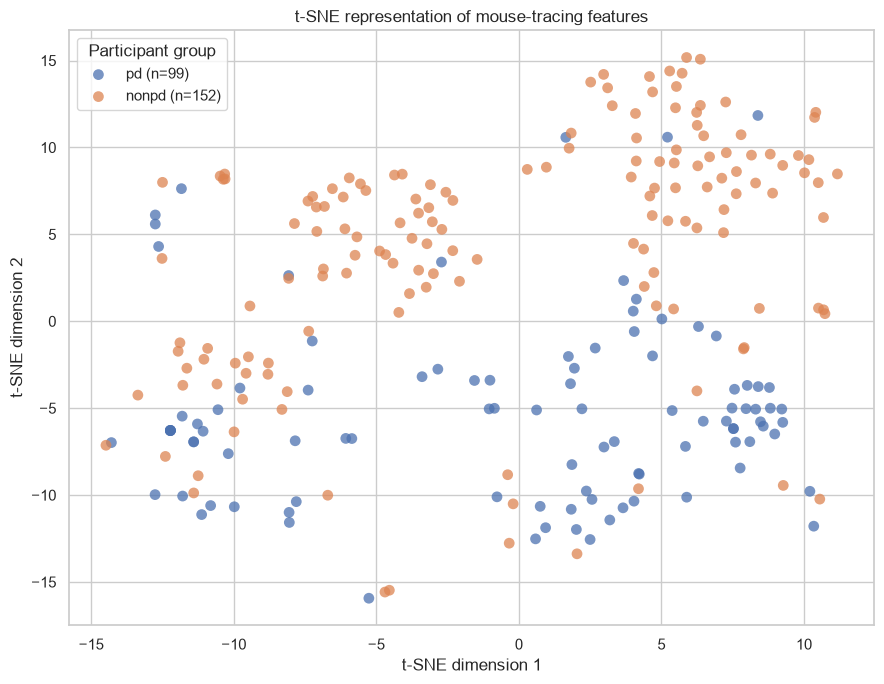

In [81]:
plt.figure(figsize=(9, 7))

for group in mouse_tsne_df["PD_status"].unique():
    group_data = mouse_tsne_df[
        mouse_tsne_df["PD_status"] == group
    ]

    plt.scatter(
        group_data["tSNE_1"],
        group_data["tSNE_2"],
        label=f"{group} (n={len(group_data)})",
        alpha=0.75,
        s=60,
        edgecolors="none",
    )

plt.xlabel("t-SNE dimension 1")
plt.ylabel("t-SNE dimension 2")
plt.title("t-SNE representation of mouse-tracing features")
plt.legend(title="Participant group")
plt.tight_layout()
plt.show()

In [82]:
keyboard_tsne_df = calculate_tsne_for_feature_subset(
    data=X_numeric,
    labels=y,
    feature_names=keyboard_features,
)

click_tsne_df = calculate_tsne_for_feature_subset(
    data=X_numeric,
    labels=y,
    feature_names=click_reaction_features,
)

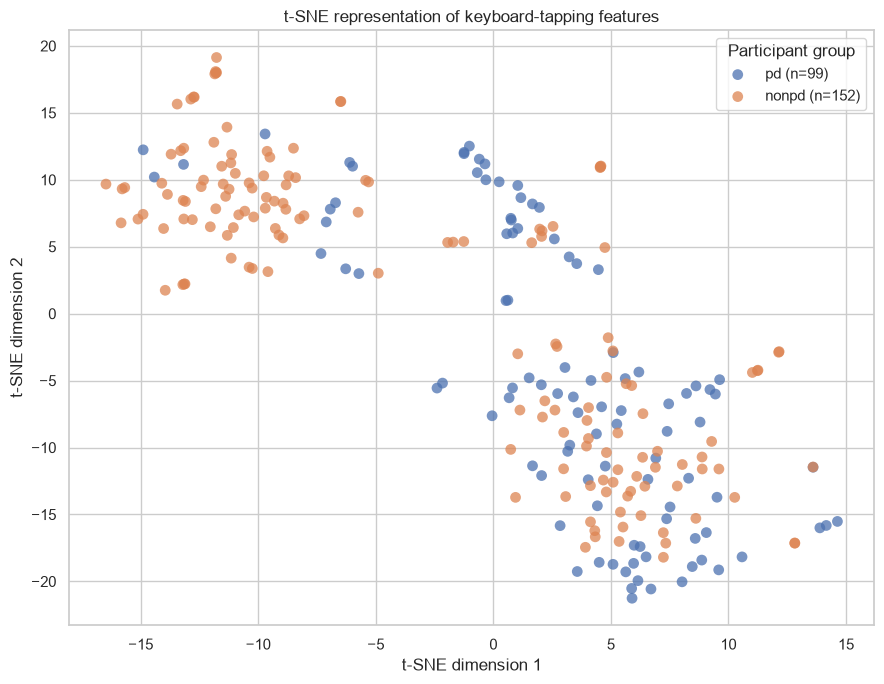

In [83]:
plt.figure(figsize=(9, 7))

for group in keyboard_tsne_df["PD_status"].unique():
    group_data = keyboard_tsne_df[
        keyboard_tsne_df["PD_status"] == group
    ]

    plt.scatter(
        group_data["tSNE_1"],
        group_data["tSNE_2"],
        label=f"{group} (n={len(group_data)})",
        alpha=0.75,
        s=60,
        edgecolors="none",
    )

plt.xlabel("t-SNE dimension 1")
plt.ylabel("t-SNE dimension 2")
plt.title("t-SNE representation of keyboard-tapping features")
plt.legend(title="Participant group")
plt.tight_layout()
plt.show()

#### **t-Test**

In [9]:
from scipy.stats import mannwhitneyu
from statsmodels.stats.multitest import multipletests

In [10]:
Xt_test = data.copy()

TARGET = "Parkinson's Disease status"
PD_LABEL = "pd"
NON_PD_LABEL = "nonpd"

In [11]:
exclude_columns = [
    "Session ID",
    "Parkinson's Disease status",
    "Age",
    "Gender",
    "Race",
    "27 Participant Height",
    "28 Dominant Hand",
    "29 Device Type",
]

feature_columns = [column for column in Xt_test.columns if column not in exclude_columns]

for column in feature_columns:
    Xt_test[column] = pd.to_numeric(Xt_test[column], errors="coerce")

Xt_test[feature_columns] = Xt_test[feature_columns].replace([np.inf, -np.inf], np.nan)

In [12]:
feature = (
    "2. Amount of time taken to trace straight line "
    "(miliseconds)"
)

pd_values = Xt_test.loc[Xt_test[TARGET] == PD_LABEL, feature].dropna()
non_pd_values = Xt_test.loc[Xt_test[TARGET] == NON_PD_LABEL,feature,].dropna()

u_statistic, p_value = mannwhitneyu(
    pd_values,
    non_pd_values,
    alternative="two-sided",
    method="auto",
)

print("Feature:", feature)
print("PD sample size:", len(pd_values))
print("Non-PD sample size:", len(non_pd_values))
print("PD median:", pd_values.median())
print("Non-PD median:", non_pd_values.median())
print("U statistic:", u_statistic)
print("p-value:", p_value)

Feature: 2. Amount of time taken to trace straight line (miliseconds)
PD sample size: 99
Non-PD sample size: 152
PD median: 3000.0
Non-PD median: 1500.0
U statistic: 11809.5
p-value: 1.1411661889126364e-14


In [13]:
def rank_biserial_effect(u_statistic: float, n_pd: int, n_non_pd: int) -> float:
    return (2 * u_statistic) / (n_pd * n_non_pd) - 1

In [14]:
effect_size = rank_biserial_effect(u_statistic,len(pd_values),len(non_pd_values))

print("Rank-biserial correlation:", effect_size)

Rank-biserial correlation: 0.5695773524720893


In [15]:
results = []

for feature in feature_columns:
    pd_values = Xt_test.loc[
        Xt_test[TARGET] == PD_LABEL,
        feature,
    ].dropna()

    non_pd_values = Xt_test.loc[
        Xt_test[TARGET] == NON_PD_LABEL,
        feature,
    ].dropna()

    # Require enough observations in both groups
    if len(pd_values) < 3 or len(non_pd_values) < 3:
        continue

    # Skip features with no variation
    combined_values = pd.concat(
        [pd_values, non_pd_values],
        ignore_index=True,
    )

    if combined_values.nunique() < 2:
        continue

    u_statistic, p_value = mannwhitneyu(
        pd_values,
        non_pd_values,
        alternative="two-sided",
        method="auto",
    )

    effect_size = rank_biserial_effect(
        u_statistic,
        len(pd_values),
        len(non_pd_values),
    )

    results.append({
        "Feature": feature,
        "PD_n": len(pd_values),
        "Non_PD_n": len(non_pd_values),
        "PD_median": pd_values.median(),
        "PD_IQR": pd_values.quantile(0.75)
        - pd_values.quantile(0.25),
        "Non_PD_median": non_pd_values.median(),
        "Non_PD_IQR": non_pd_values.quantile(0.75)
        - non_pd_values.quantile(0.25),
        "U_statistic": u_statistic,
        "Raw_p_value": p_value,
        "Rank_biserial": effect_size,
        "Absolute_effect": abs(effect_size),
    })

results_df = pd.DataFrame(results)

print("Features tested:", len(results_df))
display(results_df.head())

Features tested: 73


,Feature,PD_n,Non_PD_n,PD_median,PD_IQR,Non_PD_median,Non_PD_IQR,U_statistic,Raw_p_value,Rank_biserial,Absolute_effect
0,1. Mean deviation from centerline when tracing...,99,152,0.012924,0.015990,0.000710,0.012257,11000.5,6.265199e-10,0.462055,0.462055
1,2. Amount of time taken to trace straight line...,99,152,3000.000000,1000.000000,1500.000000,1500.000000,11809.5,1.141166e-14,0.569577,0.569577
2,2.5. Amount of time taken to trace straight li...,99,152,2.061249,0.861109,1.169135,0.759420,11622.0,2.461719e-13,0.544657,0.544657
3,3. Percentage of points traced inside straight...,99,152,0.875000,0.250000,1.000000,0.000000,4114.5,6.630030e-15,-0.453150,0.453150
4,3.5. Number of points traced inside straight l...,99,152,6.000000,4.000000,3.000000,2.000000,10711.0,8.554286e-09,0.423578,0.423578


In [16]:
rejected, adjusted_p_values, _, _ = multipletests(
    results_df["Raw_p_value"],
    alpha=0.05,
    method="fdr_bh",
)

results_df["Adjusted_p_value"] = adjusted_p_values
results_df["Significant_FDR"] = rejected

In [17]:
results_df = results_df.sort_values(
    ["Adjusted_p_value", "Absolute_effect"],
    ascending=[True, False],
).reset_index(drop=True)

display(
    results_df[
        [
            "Feature",
            "PD_n",
            "Non_PD_n",
            "PD_median",
            "Non_PD_median",
            "U_statistic",
            "Raw_p_value",
            "Adjusted_p_value",
            "Rank_biserial",
            "Significant_FDR",
        ]
    ].head(20)
)

,Feature,PD_n,Non_PD_n,PD_median,Non_PD_median,U_statistic,Raw_p_value,Adjusted_p_value,Rank_biserial,Significant_FDR
0,19. Total accumulated deviation from centerlin...,99,152,0.110736,0.030549,13014.0,1.582257e-22,1.155048e-20,0.729665,True
1,20. Avg of absolute values of deviation from c...,99,152,0.017870,0.009557,12497.0,9.083516e-19,2.264404e-17,0.660952,True
2,6. Amount of time taken to trace spiral (milis...,99,152,4000.000000,2500.000000,12464.5,9.305772e-19,2.264404e-17,0.656632,True
3,3. Percentage of points traced inside straight...,99,152,0.875000,1.000000,4114.5,6.630030e-15,1.209980e-13,-0.453150,True
4,2. Amount of time taken to trace straight line...,99,152,3000.000000,1500.000000,11809.5,1.141166e-14,1.666103e-13,0.569577,True
5,mean_of_total_amount_of_time_taken_to_trace_lines,99,152,5666.666667,2583.333333,11774.5,3.775845e-14,4.593945e-13,0.564926,True
6,6.5. Amount of time taken to trace spiral with...,99,152,2.777778,1.558846,11744.0,5.408314e-14,5.640099e-13,0.560872,True
7,7.5 Percentage of points traced inside spiral ...,99,152,8.000000,4.000000,11704.5,6.997197e-14,6.384943e-13,0.555622,True
8,2.5. Amount of time taken to trace straight li...,99,152,2.061249,1.169135,11622.0,2.461719e-13,1.996728e-12,0.544657,True
9,18. Net accumulated deviation from centerline ...,99,152,0.072447,0.001700,11557.5,7.259227e-13,5.299236e-12,0.536085,True


In [18]:
print(
    "Significant features after FDR correction:",
    results_df["Significant_FDR"].sum(),
)

Significant features after FDR correction: 59


In [19]:
def format_p_value(value: float) -> str:
    if value < 0.001:
        return "<0.001"
    return f"{value:.3f}"

In [20]:
results_df["Adjusted_p_display"] = results_df[
    "Adjusted_p_value"
].apply(format_p_value)

In [22]:
results_df.to_csv("whitney_t_test.csv", index=False)

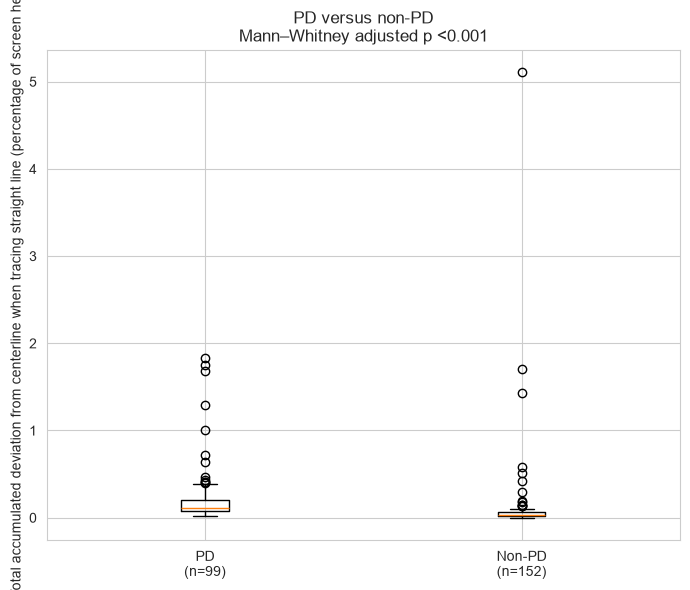

In [33]:
feature = results_df.iloc[0]["Feature"]

plot_data = Xt_test[
    [TARGET, feature]
].dropna()

groups = [
    plot_data.loc[
        plot_data[TARGET] == PD_LABEL,
        feature,
    ],
    plot_data.loc[
        plot_data[TARGET] == NON_PD_LABEL,
        feature,
    ],
]

feature_result = results_df[
    results_df["Feature"] == feature
].iloc[0]

plt.figure(figsize=(7, 6))

plt.boxplot(
    groups,
    tick_labels=[
        f"PD\n(n={len(groups[0])})",
        f"Non-PD\n(n={len(groups[1])})",
    ],
    showfliers=True,
)

plt.ylabel(feature)
plt.title(
    "PD versus non-PD\n"
    f"Mann–Whitney adjusted p "
    f"{feature_result['Adjusted_p_display']}"
)

plt.tight_layout()
plt.show()

In [49]:
significant_results = results_df[
    results_df["Significant_FDR"]
].copy()

top_features = (
    significant_results
    .sort_values("Absolute_effect", ascending=False)
    .head(9)["Feature"]
    .tolist()
)

print("Selected features:")
for feature in top_features:
    print("-", feature)

Selected features:
- 19. Total accumulated deviation from centerline when tracing straight line (percentage of screen height)
- 20. Avg of absolute values of deviation from centerline when tracing straight line (percentage of screen height)
- 6. Amount of time taken to trace spiral (miliseconds)
- 2. Amount of time taken to trace straight line (miliseconds)
- mean_of_total_amount_of_time_taken_to_trace_lines
- 6.5. Amount of time taken to trace spiral with respect to window width (miliseconds)
- 7.5 Percentage of points traced inside spiral with no regard to time taken
- 2.5. Amount of time taken to trace straight line with respect to window width (miliseconds)
- 18. Net accumulated deviation from centerline when tracing straight line (percentage of screen height)


In [52]:
import math
import textwrap

n_columns = 3
n_rows = math.ceil(len(top_features) / n_columns)

fig, axes = plt.subplots(
    n_rows,
    n_columns,
    figsize=(15, 6 * n_rows),
    dpi=600,
    constrained_layout=True,
)

axes = np.asarray(axes).reshape(-1)

for axis, feature in zip(axes, top_features):
    plot_data = Xt_test[[TARGET, feature]].dropna()

    pd_values = plot_data.loc[
        plot_data[TARGET] == PD_LABEL,
        feature,
    ]

    non_pd_values = plot_data.loc[
        plot_data[TARGET] == NON_PD_LABEL,
        feature,
    ]

    feature_result = results_df.loc[
        results_df["Feature"] == feature
    ].iloc[0]

    axis.boxplot(
        [pd_values, non_pd_values],
        tick_labels=[
            f"PD\n(n={len(pd_values)})",
            f"Non-PD\n(n={len(non_pd_values)})",
        ],
        showfliers=True,
    )

    # Wrap long feature names across multiple lines
    wrapped_feature = textwrap.fill(
        str(feature),
        width=35,
    )

    axis.set_title(
        f"{wrapped_feature}\n"
        f"FDR-adjusted p "
        f"{feature_result['Adjusted_p_display']}; "
        f"r = {feature_result['Rank_biserial']:.2f}",
        fontsize=9,
        pad=12,
    )

for axis in axes[len(top_features):]:
    axis.set_visible(False)

plt.show()